<a href="https://colab.research.google.com/github/stanislavfort/Direct_Ascent_Synthesis/blob/main/Direct_Ascent_Synthesis_generation_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')

GOOGLE_DRIVE_PATH = os.path.join('drive', 'My Drive', 'DL_TA')
os.chdir(GOOGLE_DRIVE_PATH)

# Basic demo for Direct Ascent Synthesis (DAS)
This is a basic demo that showcases the key capabilities of the Direct Ascent Synthesis (DAS) method by Stanislav Fort and Jonathan Withaker described in the paper [Direct Ascent Synthesis: Revealing Hidden Generative Capabilities in Discriminative Models
](https://arxiv.org/abs/2502.07753) (https://arxiv.org/abs/2502.07753)

# Basic setup

In [1]:
!nvidia-smi

Sun Feb 16 16:57:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   29C    P0             46W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [2]:
! pip install open_clip_torch
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 kB 291.8 kB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 832.8 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 1.4 MB/s eta 0:00:0000:0100:01
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-hwdu_zr8
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-hwdu_zr8
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=9fb63da1151058b81ff30a4d736645e5d5b5a8278303116fc0e648577ca5fc4a
  Stored in directory: /tmp/pip-ephem-wheel-cache-0xg8io3e/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip


In [3]:
import clip
import torch
from PIL import Image
import open_clip
import tqdm
import matplotlib.pyplot as plt
from torch.optim import AdamW, Adam, SGD
import numpy as np
import torch.nn.functional as F
from torch.optim.lr_scheduler import CosineAnnealingLR, LambdaLR
from scipy import stats
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

# Getting the CLIP models

In [13]:
# choosing the CLIP models to load
models_to_load = [
    ("ViT-B-32", "laion400m_e32"),
    ("ViT-B-32", "laion2b_s34b_b79k"),
    ("OpenAI-ViT-B/32", None),
]


# loading the CLIP models and their associated tokenizes + normalization fns
models = []
for model_name, pretrained in models_to_load:

    print(f"Loading {model_name} on data {pretrained}")

    if pretrained is not None:  # openclip models
        model, _, preprocess = open_clip.create_model_and_transforms(
            model_name=model_name, 
            pretrained=pretrained
        )
        model.to("cuda")
        tokenizer = open_clip.get_tokenizer(model_name)

        print(f"Loaded {model_name} {preprocess}")

        mean = preprocess.transforms[-1].mean
        std = preprocess.transforms[-1].std

        models.append((model, tokenizer, mean, std))

    else:  # clip models
        model, preprocess = clip.load(model_name.split("OpenAI-")[1])
        model.cuda().eval()
        tokenizer = clip.tokenize

        print(f"Loaded {model_name} {preprocess}")

        mean = preprocess.transforms[-1].mean
        std = preprocess.transforms[-1].std

        models.append((model, tokenizer, mean, std))

Loading ViT-B-32 on data laion400m_e32


/home/mehdi/anaconda3/lib/python3.11/site-packages/open_clip/factory.py:388: UserWarning: These pretrained weights were trained with QuickGELU activation but the model config does not have that enabled. Consider using a model config with a "-quickgelu" suffix or enable with a flag.
  warnings.warn(


Loaded ViT-B-32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7516facdc5e0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Loading ViT-B-32 on data laion2b_s34b_b79k
Loaded ViT-B-32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7516facdc5e0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Loading OpenAI-ViT-B/32 on data None
Loaded OpenAI-ViT-B/32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x751715f41300>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


# Tooling for dealing with CLIPs

In [6]:
def normalize_for_clip(x, mean, std):
    return (x - torch.Tensor(mean).reshape([1, 3, 1, 1]).to("cuda")) / torch.Tensor(std).reshape([1, 3, 1, 1]).to("cuda")

In [7]:
# getting encoded text vectors
def get_many_text_features(model, tokenizer, texts):
    tokenized_text = tokenizer(texts).to("cuda")
    text_features = model.encode_text(tokenized_text)
    return text_features

In [8]:
def loss_between_images_and_text(
    model,
    batch_of_images,  # [batch, 3, 224, 224]
    text_features,  # [number of texts, 512]
    target_values=None,
):

    text_features_normed = text_features / \
        text_features.norm(dim=-1, keepdim=True)

    image_features = model.encode_image(batch_of_images)
    image_features_normed = image_features / \
        image_features.norm(dim=-1, keepdim=True)

    scores = image_features_normed @ text_features_normed.T

    if target_values is None:
        return torch.mean(scores, axis=1)  # [images, texts]
    else:
        # [images, texts]
        return torch.mean(scores*torch.Tensor(target_values).to("cuda").reshape([1, -1]), axis=1)

In [9]:
def raw_to_real_image(raw_image):
    return (torch.tanh(raw_image)+1.0)/2.0


def real_to_raw_image(real_image, eps=1e-5):
    tanh_result = torch.clip(real_image, eps, 1-eps)*2.0-1.0
    return torch.arctanh(tanh_result)

## CLIP embeddigns for multiple images at once

In [10]:
# getting encoded image vectors for reference images
def get_many_image_features(model, batch_of_images):
    image_features = model.encode_image(batch_of_images)
    return image_features

# Augmentation tools

In [11]:
def add_jitter(x, size=3, res=224):
    in_res = x.shape[2]
    if size > 0:
        x_shift = np.random.choice(range(-size, size+1))
        y_shift = np.random.choice(range(-size, size+1))
    elif size == 0:
        x_shift = 0
        y_shift = 0
    x = torch.roll(x, shifts=(x_shift, y_shift), dims=(-2, -1))
    x = x[:, :, (in_res-res)//2:(in_res-res)//2+res,
          (in_res-res)//2:(in_res-res)//2+res]
    return x


def add_noise(x, scale=0.1):
    return x + (torch.rand_like(x))*scale


def make_image_augmentations(
    image_in,
    count=1,
    clip=True,
    jitter_scale=3,
    noise_scale=0.1,
):

    images_collected = []

    for _ in range(count):
        image_resized_now = image_in
        image_resized_now = add_jitter(
            image_resized_now, size=jitter_scale) if jitter_scale is not None else add_jitter(image_resized_now, size=0)
        image_resized_now = add_noise(
            image_resized_now, scale=noise_scale) if noise_scale is not None else image_resized_now
        images_collected.append(image_resized_now)

    return torch.clip((torch.concatenate(images_collected, axis=0)), 0, 1) if clip else (torch.concatenate(images_collected, axis=0))

# Image generation using DAS

In [20]:
all_image_perturbations = None


def generate_image(
    models_and_tokenizers_to_use,
    target_texts_and_values,
    starting_image=None,
    original_resolution=224,
    large_resolution=224+2*56,  # adding the buffer on the side
    resolutions=range(1, 336+1),
    batch_size=32,
    lr=2e-1,
    steps=100,
    jitter_scale=56,  # x-y pixel jitter
    noise_scale=0.2,
    augmentation_copies=32,  # how many augmentations to get a gradient from at once
    greyscale_only=False,
    gradient_sign_only=False,  # to get only the gradient signs, needs 1e4 smaller LR or so
    attack_size_factor=None,  # 40/255 # for limiting the attack size
    step_to_show=10,  # how often to show the image during generation
    multiple_generations_at_once=1,
    guiding_images_tensor=None,
    separate_image_weights=None,
    inpainting_mask=None,
):

    global all_image_perturbations
    global collected_images

    target_texts = [x[1] for x in target_texts_and_values]
    target_values = [x[0] for x in target_texts_and_values]

    # just making sure no duplicates and sorted
    resolutions = list(sorted(list(set(resolutions))))
    print(f"resolutions={resolutions}")

    # encoding the texts with the models
    text_features_list = [torch.Tensor(get_many_text_features(model, tokenizer, target_texts).detach()).to(
        "cuda") for (model, tokenizer, _, _) in models_and_tokenizers_to_use]

    if guiding_images_tensor is not None:
        guiding_images_features_list = [torch.Tensor(get_many_image_features(model, normalize_fns_list[j](guiding_images_tensor.to(
            "cuda"))).detach()).to("cuda") for j, (model, tokenizer, _, _) in enumerate(models_and_tokenizers_to_use)]

        # adding them to the text_features_list
        text_features_list = [torch.concatenate(
            [text_features_list[i], guiding_images_features_list[i]], axis=0) for i in range(len(text_features_list))]

        if separate_image_weights is None:
            target_values = target_values + \
                ([1.0]*guiding_images_tensor.shape[0])
        else:
            target_values = target_values + separate_image_weights

    image_count = augmentation_copies
    batch_count = int(np.ceil(image_count/batch_size))

    if starting_image is None:
        # the image to start from
        np_image_now = np.ones(
            (multiple_generations_at_once, 3, large_resolution, large_resolution))*0.5
    else:
        np_image_now = np.concatenate(
            [starting_image]*multiple_generations_at_once, axis=0)

    torch_image_raw = real_to_raw_image(torch.Tensor(np_image_now).to("cuda"))
    original_image = torch.Tensor(np_image_now).to("cuda")

    very_start_image = np.array(np_image_now)

    # getting all perturbations at all resolutions to train
    total_perturbation = 0.0
    all_image_perturbations = [torch.Tensor(
        0.0*(np.random.rand(*(multiple_generations_at_once, 3, res, res))*2-1)).to("cuda") for res in resolutions]
    for i, p in enumerate(all_image_perturbations):
        p.requires_grad = True

    optimizer = SGD(all_image_perturbations, lr=lr)  # , weight_decay=1e-5)

    # Scheduler setup -- just constant works well!
    scheduler = LambdaLR(optimizer, lambda step: 1.0)

    images_to_start_raw = torch_image_raw.to("cuda")

    collected_images = []

    tqdm_range = tqdm.tqdm(range(steps))

    for step in tqdm_range:

        total_perturbation = 0.0
        for i, p in enumerate(all_image_perturbations):
            upscaled_perturbation_now = F.interpolate(p, size=(
                large_resolution, large_resolution), mode='bicubic' if resolutions[i] > 1 else 'nearest')
            total_perturbation += upscaled_perturbation_now

        image_perturbation_to_use = total_perturbation

        if greyscale_only:
            image_perturbation_to_use = torch.mean(
                image_perturbation_to_use, axis=1, keepdims=True)

        # Register gradient hook to mask gradients during backward pass
        def hook_fn(grad):
            if inpainting_mask is not None:
                return grad * inpainting_mask
            return grad

        if inpainting_mask is not None:
            image_perturbation_to_use.register_hook(hook_fn)

        if attack_size_factor is None:
            collected_images.append(
                raw_to_real_image(
                    (images_to_start_raw + image_perturbation_to_use)).detach().cpu().numpy()
            )
        else:
            collected_images.append(
                np.clip((original_image + attack_size_factor*(raw_to_real_image(images_to_start_raw +
                        image_perturbation_to_use) - original_image)).detach().cpu().numpy(), 0, 1)
            )

        losses_split = []

        losses = []
        for it in range(batch_count):
            i1 = it*batch_size
            i2 = min([(it+1)*batch_size, image_count])

            for i_model, (model, tokenizer, mean, std) in enumerate(models_and_tokenizers_to_use):

                model.eval()

                if attack_size_factor is None:
                    image_to_augment = raw_to_real_image(
                        images_to_start_raw + image_perturbation_to_use)
                else:
                    image_to_augment = original_image.to("cuda") + attack_size_factor*(raw_to_real_image(
                        images_to_start_raw + image_perturbation_to_use) - original_image.to("cuda"))

                # if I want to recompute them for each step, fixed by default
                augmentation_copies_to_use = augmentation_copies
                jitter_scale_to_use = jitter_scale
                noise_scale_to_use = noise_scale

                image_variations = make_image_augmentations(
                    image_to_augment.to("cuda"),
                    i2-i1,
                    augmentation_copies_to_use,
                    jitter_scale=jitter_scale_to_use,
                    noise_scale=noise_scale_to_use,
                )

                # print(f"target_values {target_values}")

                loss = -1.0*loss_between_images_and_text(
                    model,
                    normalize_fns_list[i_model](
                        torch.clip(image_variations[:i2-i1], 0, 1)),
                    text_features_list[i_model],
                    target_values=target_values,
                )

                loss = torch.mean(loss)*multiple_generations_at_once
                losses.append(loss.item())
                loss.backward(retain_graph=True)

        # getting just the gradient sign
        if gradient_sign_only:
            for i, p in enumerate(all_image_perturbations):
                p.grad.data.sign_()

        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()

        ell_infty = np.max(
            np.abs(collected_images[-1][0]-collected_images[0][0]))*255

        if step % step_to_show == 0:
            print(f"step={step} {losses} ell_infty={int(ell_infty*10)/10}/255")

            plt.figure(figsize=(3*5.5, multiple_generations_at_once*5), dpi=75)
            for version_i in range(multiple_generations_at_once):
                plt.subplot(multiple_generations_at_once, 3, 1+version_i*3)
                plt.imshow(
                    np.clip((collected_images[0][version_i].transpose(
                        [1, 2, 0])*255).astype(np.uint8), 0, 255)
                )
                plt.xticks([], [])
                plt.yticks([], [])

                plt.subplot(multiple_generations_at_once, 3, 2+version_i*3)
                plt.imshow(
                    np.clip(
                        (collected_images[-1][version_i].transpose([1, 2, 0])*255).astype(np.uint8), 0, 255)
                )
                plt.xticks([], [])
                plt.yticks([], [])

                plt.subplot(multiple_generations_at_once, 3, 3+version_i*3)
                plt.imshow(
                    np.clip(((0.5+(collected_images[-1][version_i]-collected_images[0]
                            [version_i]).transpose([1, 2, 0]))*255).astype(np.uint8), 0, 255)
                )
                plt.xticks([], [])
                plt.yticks([], [])

            plt.show()

    return collected_images

## Chosing the models to use in the ensemble

In [14]:
# fixing the model selection
chosen_model_ids = [0, 1, 2]
models_and_tokenizers_to_use = [
    x for i, x in enumerate(models) if i in chosen_model_ids]
normalize_fns_list = [lambda x: normalize_for_clip(x, mean, std) for (
    _, _, mean, std) in models_and_tokenizers_to_use]  # getting the normalization functions

# Plotting and analysis tool

In [15]:
def display_images(
    collected_images,
    large_resolution=336,
    original_resolution=224,
    show_guiding_image=False,
    show_starting_image=False,
    guiding_images_batch=None,
    start_images_batch=None,
):

    offset = int((large_resolution-original_resolution)/2)

    versions_to_show = collected_images[-1].shape[0] if not show_guiding_image else collected_images[-1].shape[0]+1
    versions_to_show = versions_to_show + \
        1 if show_starting_image else versions_to_show

    plotted_images = []

    plt.figure(figsize=(versions_to_show*224/100, 224/100), dpi=112)
    offset = (large_resolution - original_resolution)//2

    for v in range(versions_to_show):
        plt.subplot(1, versions_to_show, v+1)

        if v < collected_images[-1].shape[0]:
            numpy_image_to_show = np.clip((collected_images[-1][v][:, offset:offset+original_resolution,
                                          offset:offset+original_resolution].transpose([1, 2, 0])*255).astype(np.uint8), 0, 255)
        elif (show_guiding_image or show_starting_image) and not (show_guiding_image and show_starting_image):
            if show_guiding_image:
                numpy_image_to_show = guiding_images_batch[0].detach(
                ).cpu().numpy().transpose([1, 2, 0])
            elif show_starting_image:
                numpy_image_to_show = start_images_batch[0].detach().cpu(
                ).numpy().transpose([1, 2, 0])[offset:-offset, offset:-offset]
        elif show_guiding_image and show_starting_image:
            if v == versions_to_show-2:
                numpy_image_to_show = guiding_images_batch[0].detach(
                ).cpu().numpy().transpose([1, 2, 0])
            elif v == versions_to_show-1:
                numpy_image_to_show = start_images_batch[0].detach().cpu(
                ).numpy().transpose([1, 2, 0])[offset:-offset, offset:-offset]

        plt.imshow(
            numpy_image_to_show
        )
        plotted_images.append(numpy_image_to_show)

        plt.xticks([], [])
        plt.yticks([], [])
        plt.gca().set_axis_off()  # Turn off the axis
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
        plt.margins(0, 0)  # Remove all margins
        plt.gca().xaxis.set_major_locator(plt.NullLocator())  # Remove x-axis ticks
        plt.gca().yaxis.set_major_locator(plt.NullLocator())  # Remove y-axis ticks

    plt.show()

In [16]:
def visualize_individual_resolutions(
    all_image_perturbations,
    version_i=0,
    selection_resolutions=[1, 2, 4, 8, 16, 32, 64],
    large_resolution=336,

):
    # visualizing the image perturbations in all_image_perturbations
    plt.figure(figsize=(3*len(selection_resolutions), 3*2))
    for i, p in enumerate(all_image_perturbations):
        if all_image_perturbations[i].shape[2] in selection_resolutions:
            print(f"{i} {all_image_perturbations[i].shape}")

            plt.subplot(2, len(selection_resolutions), selection_resolutions.index(
                all_image_perturbations[i].shape[2])+1)

            data = all_image_perturbations[i][version_i]
            data = raw_to_real_image(data).detach(
            ).cpu().numpy().transpose([1, 2, 0])
            data = data - np.min(data)
            data = data / np.max(data)

            plt.imshow(
                data
            )

            plt.xticks([], [])
            plt.yticks([], [])
            plt.gca().set_axis_off()  # Turn off the axis
            plt.gca().xaxis.set_major_locator(plt.NullLocator())  # Remove x-axis ticks
            plt.gca().yaxis.set_major_locator(plt.NullLocator())  # Remove y-axis ticks

            plt.subplot(2, len(selection_resolutions), selection_resolutions.index(
                all_image_perturbations[i].shape[2])+1+len(selection_resolutions))

            # use the interpolation from the attack function on the data
            data_interpolated = F.interpolate(all_image_perturbations[i], size=(
                large_resolution, large_resolution), mode='bicubic')

            data = raw_to_real_image(data_interpolated[version_i]).detach(
            ).cpu().numpy().transpose([1, 2, 0])
            data = data - np.min(data)
            data = data / np.max(data)

            plt.imshow(
                data
            )

            plt.xticks([], [])
            plt.yticks([], [])
            plt.gca().set_axis_off()  # Turn off the axis
            plt.gca().xaxis.set_major_locator(plt.NullLocator())  # Remove x-axis ticks
            plt.gca().yaxis.set_major_locator(plt.NullLocator())  # Remove y-axis ticks

    plt.show()

In [17]:
def analyze_perturbations(all_image_perturbations):
    """
    Analyze image perturbations across different resolutions and fit a power law.

    Parameters:
    all_image_perturbations: list of torch tensors containing perturbations at different resolutions

    Returns:
    slope: float, the power law exponent
    intercept: float, the y-intercept of the fitted line
    r_value: float, the correlation coefficient
    """
    # Calculate variances and get resolutions
    rs = []
    vars = []
    for i, p in enumerate(all_image_perturbations):
        vars.append(torch.var(all_image_perturbations[i]).detach().cpu().numpy())
        rs.append(all_image_perturbations[i].shape[2])

    # Convert to numpy arrays and take logs
    log_rs = np.log(rs)
    log_vars = np.log(vars)

    # Fit line to log-log data
    slope, intercept, r_value, p_value, std_err = stats.linregress(log_rs, log_vars)

    # Create plot
    plt.figure(figsize=(5, 5))

    # Plot data points
    plt.loglog(rs, vars, 'o', color='skyblue', label='Data')

    # Plot fitted line
    x_fit = np.array([min(rs), max(rs)])
    y_fit = np.exp(intercept + slope * np.log(x_fit))
    plt.loglog(x_fit, y_fit, '--', color='red',
               label=f'Fitted line (slope = {slope:.3f})')

    plt.grid(True, which="both", ls="-", alpha=0.2)
    plt.xlabel('Resolution',fontsize=14)
    plt.ylabel('Variance',fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title('Perturbation Variance vs. Resolution',fontsize=14)
    plt.legend()

    return slope, intercept, r_value

# Task 1 = Image generation from text

In [18]:
target_texts_and_values = [
    (1.0, "a photo of a meteor streaking through the night sky, detailed"),
    (-0.3, "Optical Character Recognition"),
    (0.3, "octane render, unreal engine, ray tracing, volumetric lighting"),
    (-0.3, "multiple exposure"),
]

In [21]:
collected_images = generate_image(
    models_and_tokenizers_to_use,
    target_texts_and_values,
)

resolutions=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

  0%|          | 0/100 [00:00<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 5.62 GiB of which 16.50 MiB is free. Including non-PyTorch memory, this process has 5.59 GiB memory in use. Of the allocated memory 5.35 GiB is allocated by PyTorch, and 141.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

## Resulting image

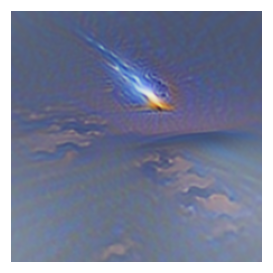

In [39]:
display_images(
    collected_images,
)

### Individual resolutions

0 torch.Size([1, 3, 1, 1])
1 torch.Size([1, 3, 2, 2])
3 torch.Size([1, 3, 4, 4])
7 torch.Size([1, 3, 8, 8])
15 torch.Size([1, 3, 16, 16])
31 torch.Size([1, 3, 32, 32])
63 torch.Size([1, 3, 64, 64])


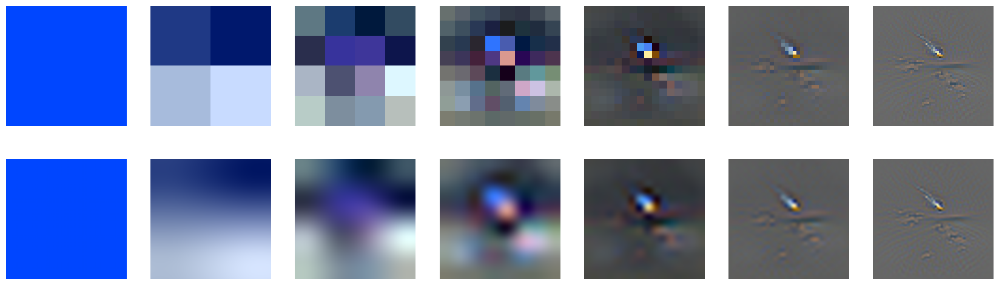

In [40]:
visualize_individual_resolutions(all_image_perturbations)

### Spectral analysis

Power law exponent: -2.476
R-squared value: 0.995


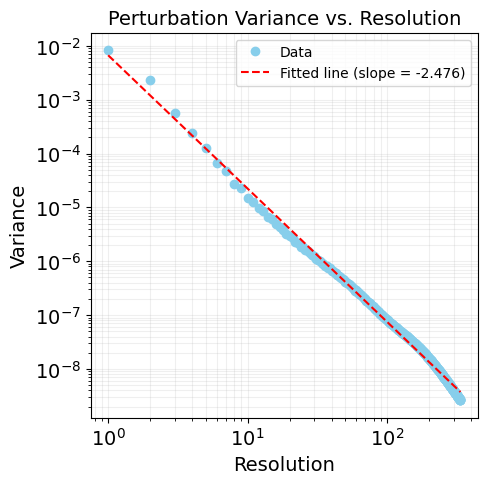

In [41]:
slope, intercept, r_value = analyze_perturbations(all_image_perturbations)
print(f"Power law exponent: {slope:.3f}")
print(f"R-squared value: {r_value**2:.3f}")
plt.show()

# Task 2 = Generation stability over multiple runs

In [21]:
target_texts_and_values = [
  (1.0, "a beautiful photo of Antelope Canyon’s light beams., detailed"),
  (-0.3,"Optical Character Recognition"),
  (0.3, "octane render, unreal engine, ray tracing, volumetric lighting"),
  (-0.3, "multiple exposure"),
]

resolutions=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [0.012275687418878078, -0.036463841795921326, -0.12095221877098083] ell_infty=0.0/255


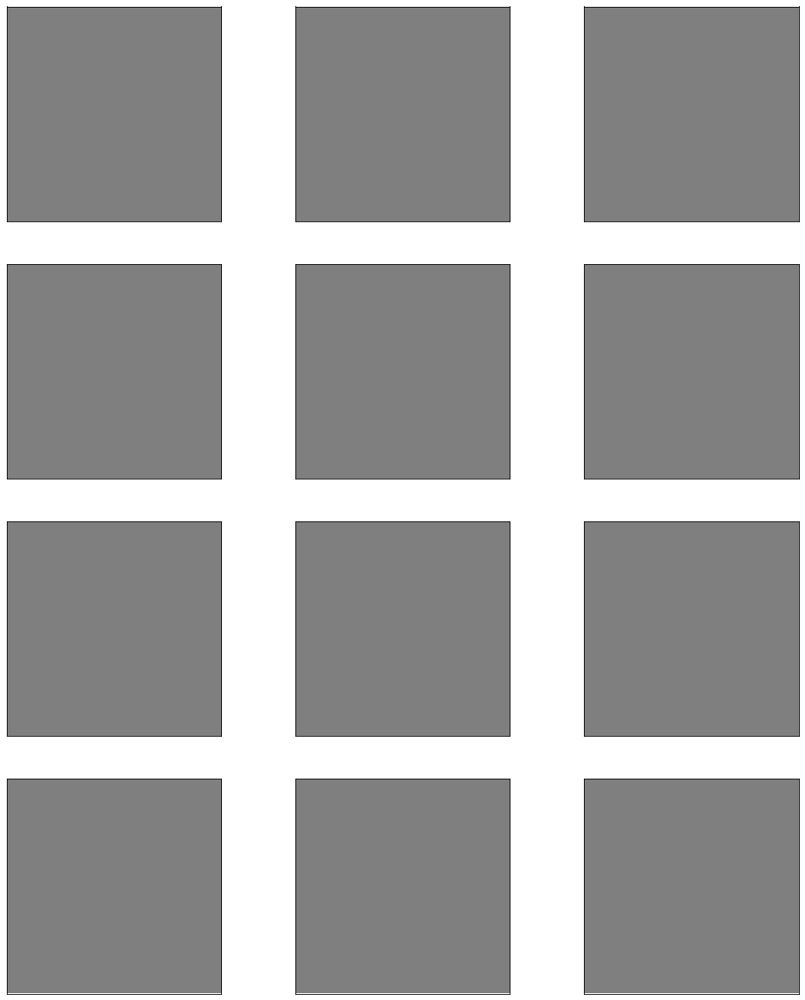

 10%|█         | 10/100 [00:10<01:31,  1.02s/it]

step=10 [-0.18382027745246887, -0.1774853765964508, -0.2220836728811264] ell_infty=90.8/255


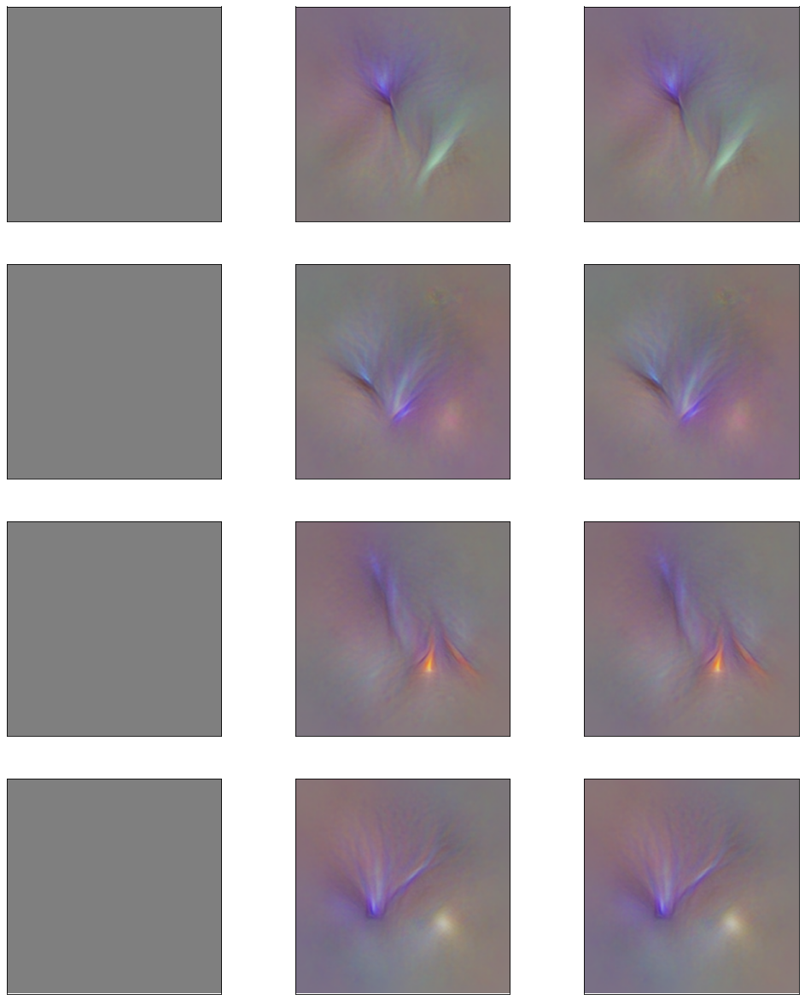

 20%|██        | 20/100 [00:20<01:22,  1.03s/it]

step=20 [-0.25020089745521545, -0.2531610429286957, -0.28397905826568604] ell_infty=100.7/255


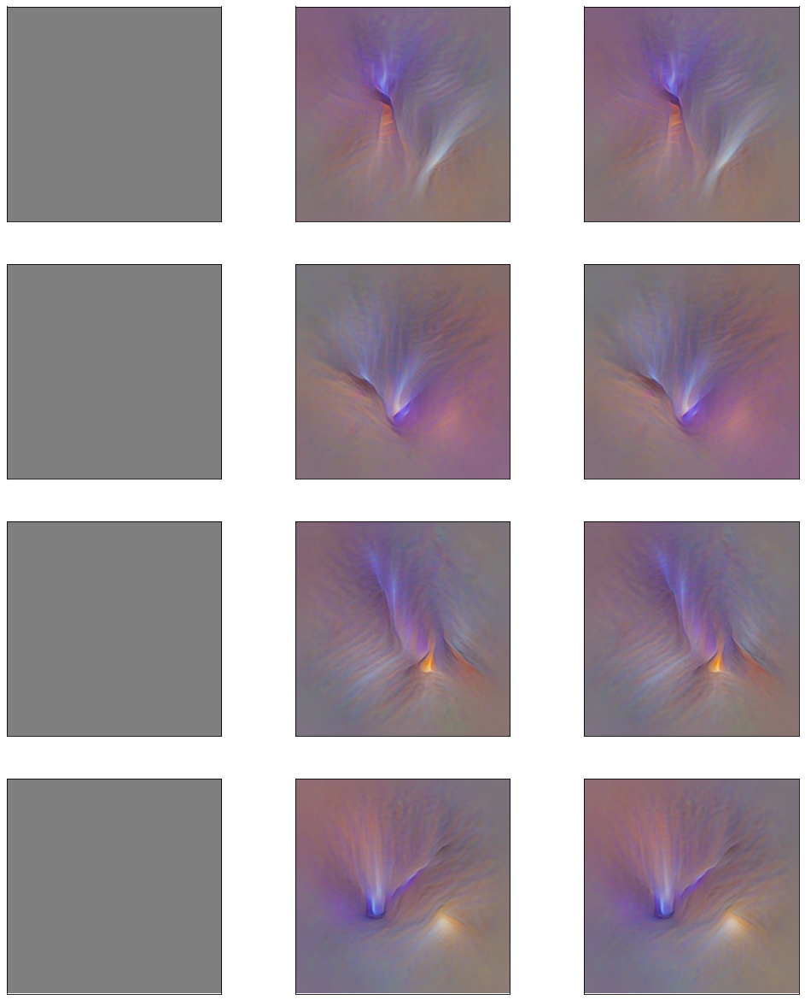

 30%|███       | 30/100 [00:31<01:11,  1.03s/it]

step=30 [-0.29515668749809265, -0.29346364736557007, -0.3242477476596832] ell_infty=104.5/255


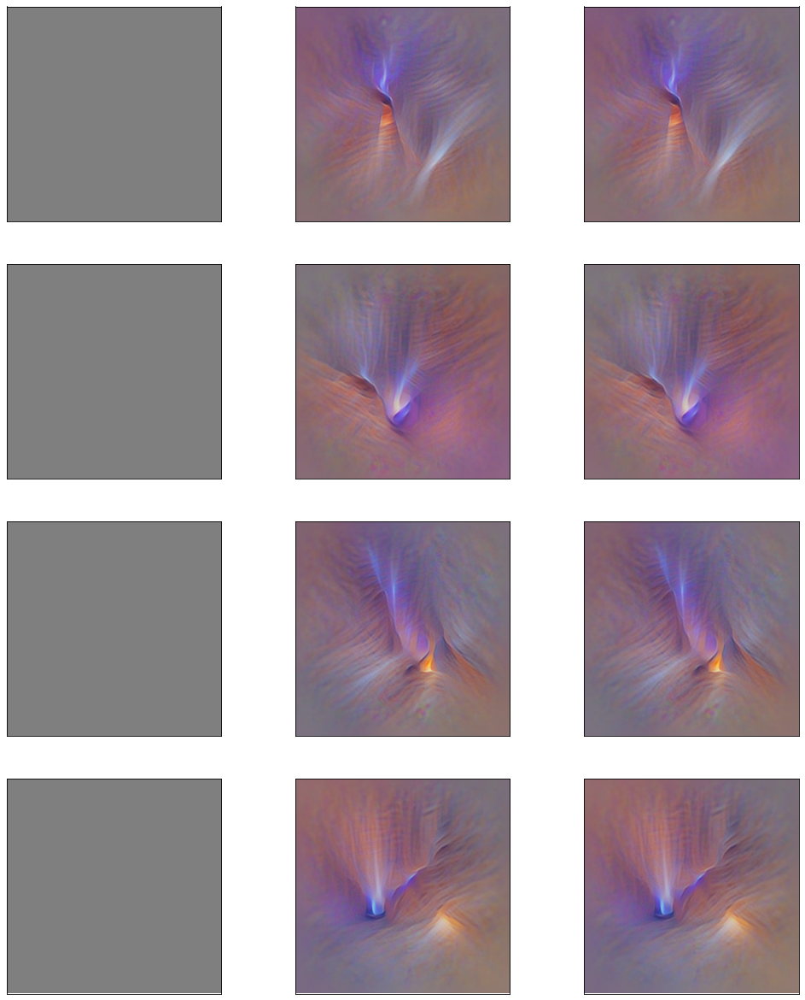

 40%|████      | 40/100 [00:41<01:01,  1.03s/it]

step=40 [-0.32229912281036377, -0.30754566192626953, -0.3359329104423523] ell_infty=106.3/255


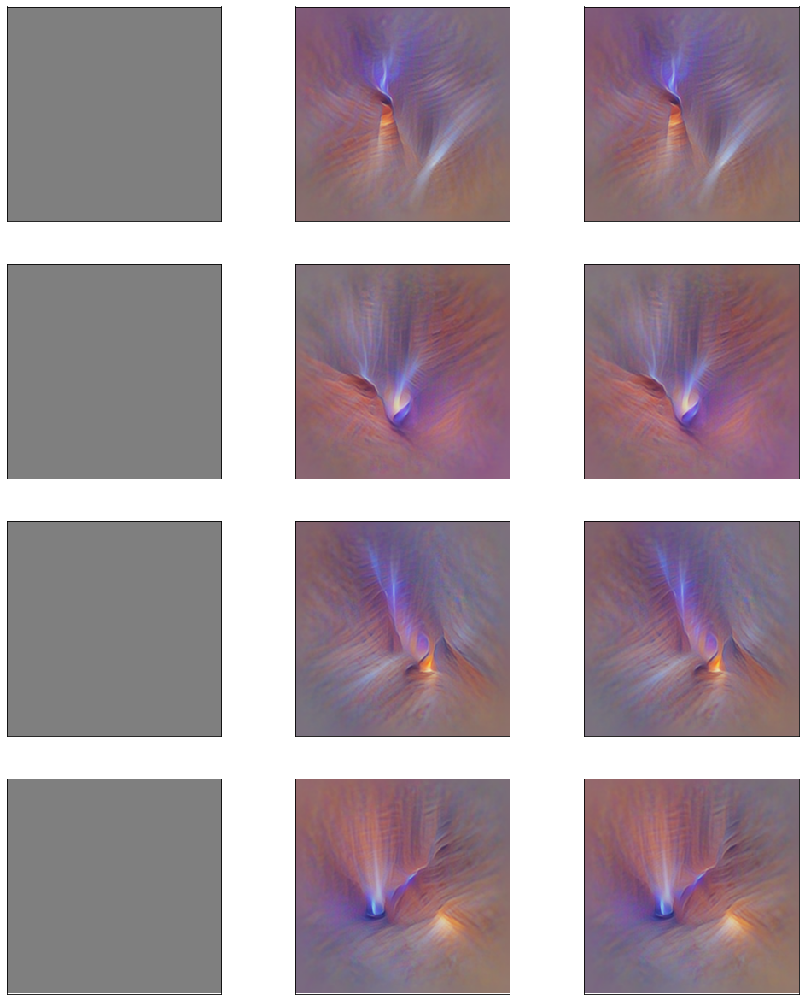

 50%|█████     | 50/100 [00:52<00:51,  1.03s/it]

step=50 [-0.3344968557357788, -0.32087379693984985, -0.34600791335105896] ell_infty=107.4/255


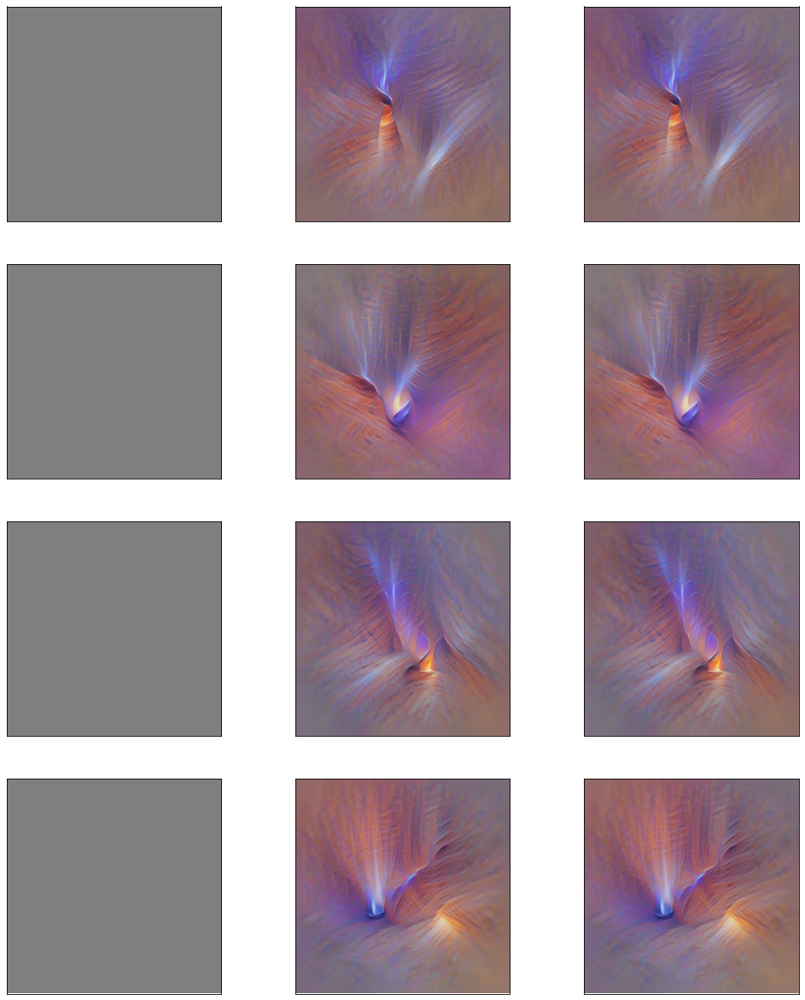

 60%|██████    | 60/100 [01:02<00:41,  1.03s/it]

step=60 [-0.3450750708580017, -0.3348405957221985, -0.34895437955856323] ell_infty=109.3/255


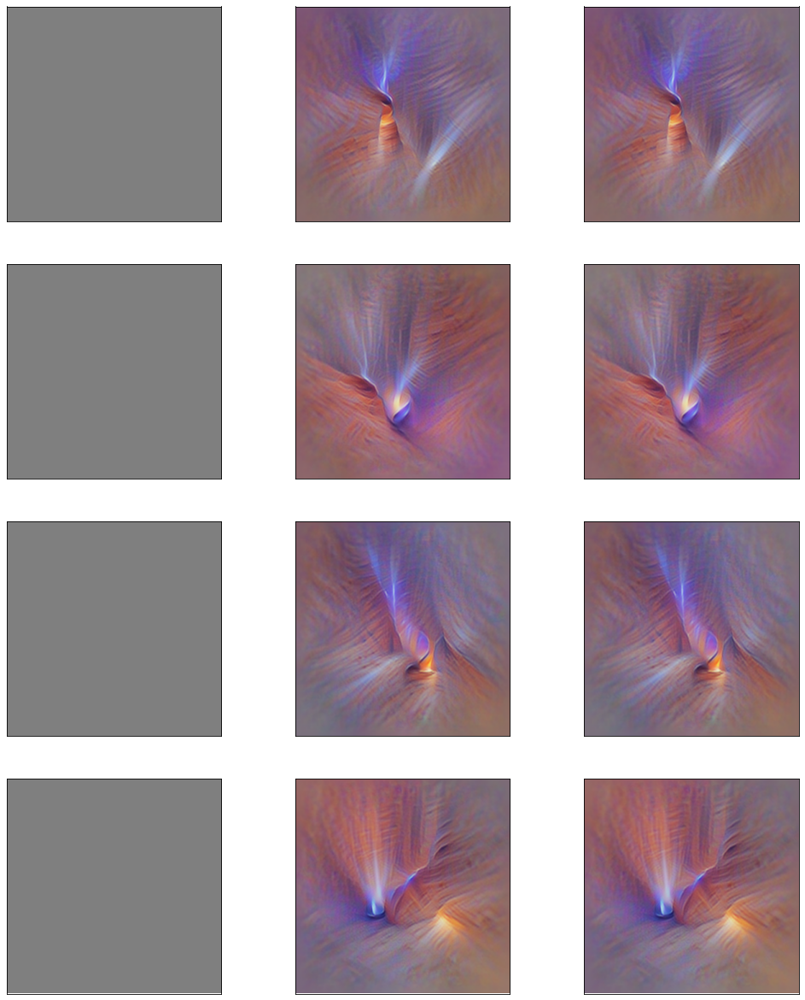

 70%|███████   | 70/100 [01:13<00:30,  1.03s/it]

step=70 [-0.3528461456298828, -0.3402312994003296, -0.36126673221588135] ell_infty=110.8/255


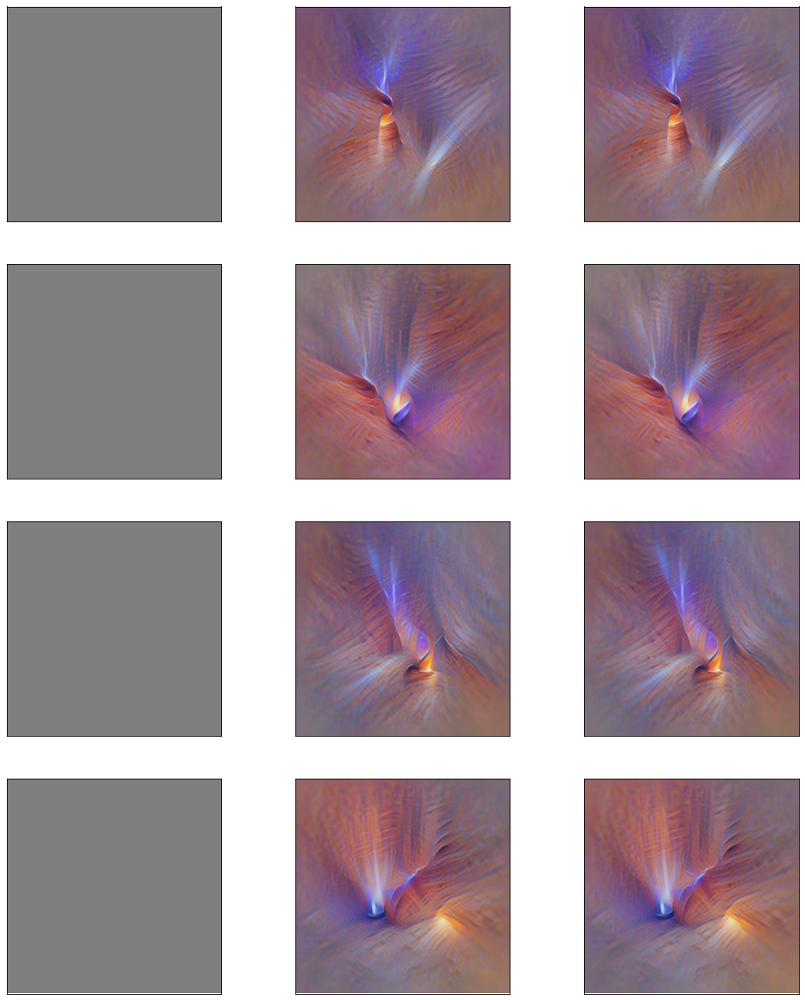

 80%|████████  | 80/100 [01:23<00:20,  1.03s/it]

step=80 [-0.3586936891078949, -0.3487149477005005, -0.3585681915283203] ell_infty=112.1/255


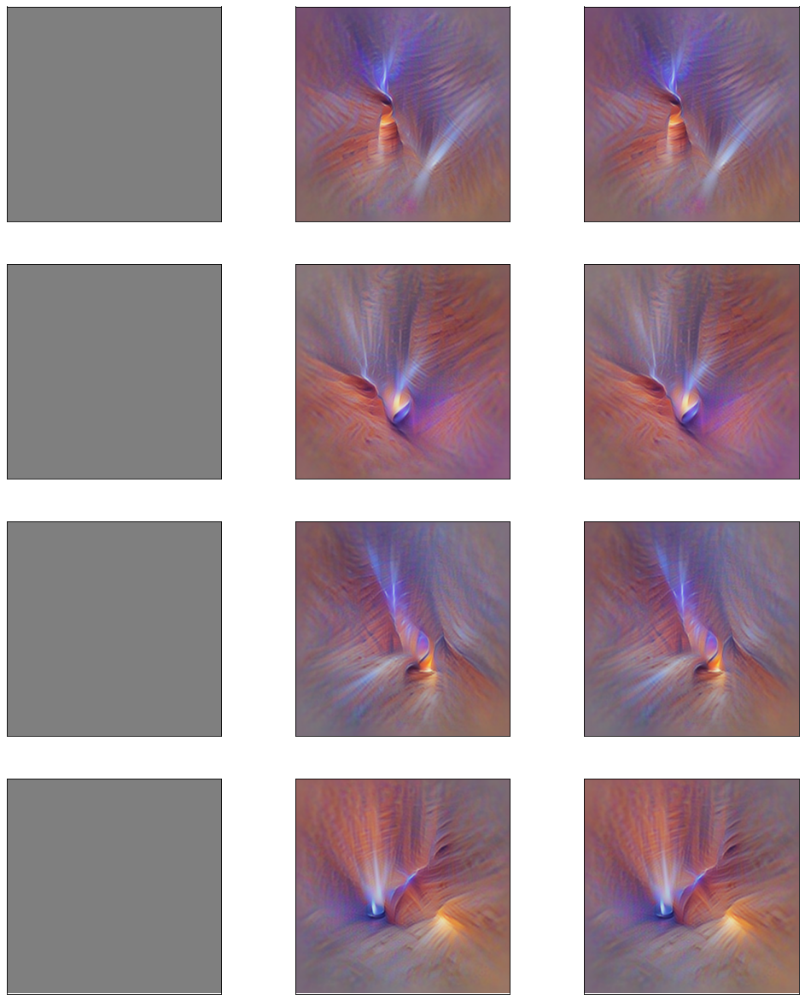

 90%|█████████ | 90/100 [01:34<00:10,  1.02s/it]

step=90 [-0.3687908947467804, -0.35318613052368164, -0.36525076627731323] ell_infty=112.8/255


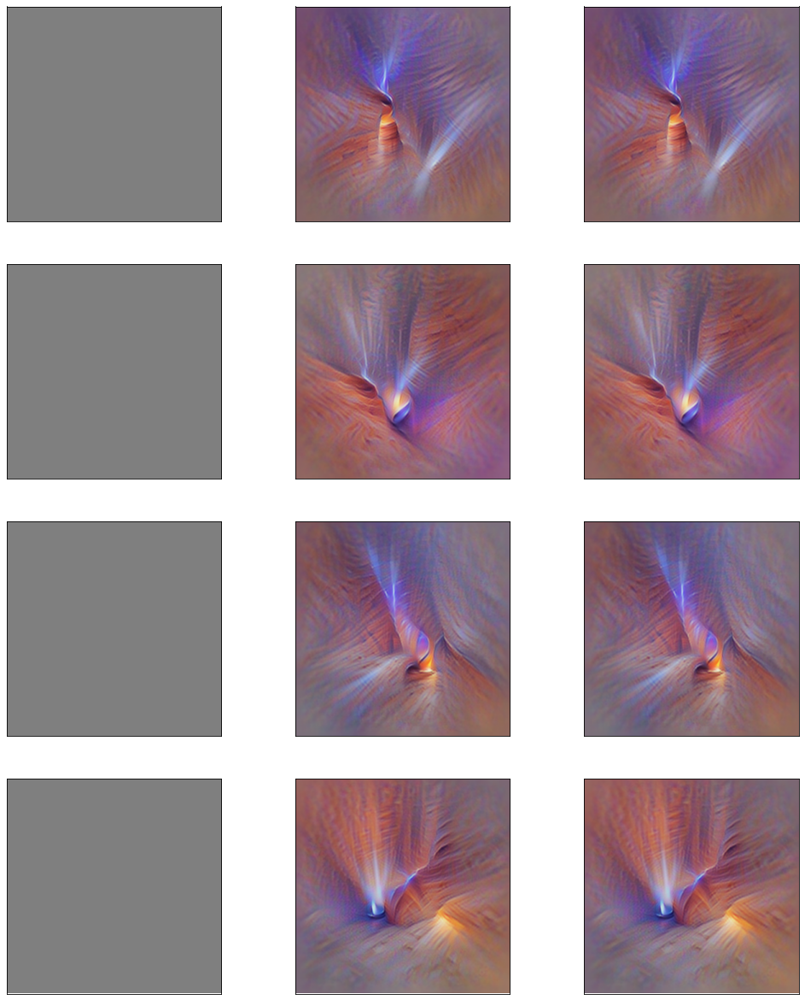

100%|██████████| 100/100 [01:44<00:00,  1.05s/it]


In [22]:
collected_images = generate_image(
  models_and_tokenizers_to_use,
  target_texts_and_values,
  multiple_generations_at_once=4,
)

## Resulting images

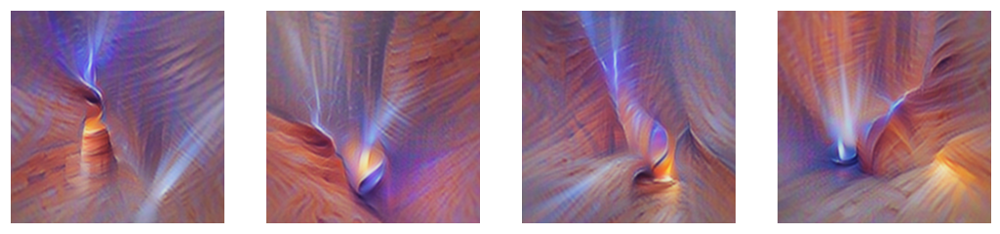

In [23]:
display_images(
    collected_images,
)

# Task 3 = "Style" transfer

In [24]:
class ImageDataset(Dataset):
    def __init__(self, image_paths):
        self.image_paths = image_paths

        # Define the transformation pipeline
        self.transform = transforms.Compose([
            transforms.Resize(224),  # Resize shorter side to 224, maintain aspect ratio
            transforms.CenterCrop(224),  # Crop the center 224x224
            transforms.ToTensor(),  # Convert to tensor and normalize to [0,1]
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        tensor = self.transform(image)
        return tensor

def load_images(image_paths, batch_size=32):
    """
    Load images from list of paths and return batched tensor

    Args:
        image_paths (list): List of paths to image files
        batch_size (int): Size of batches to return

    Returns:
        DataLoader that yields tensors of shape [batch_size, 3, 224, 224]
    """
    dataset = ImageDataset(image_paths)
    dataloader = DataLoader(dataset,
                          batch_size=batch_size,
                          shuffle=False,
                          num_workers=4)
    return dataloader

### Starting image

In [25]:
!wget https://www.noesnest.com/wp-content/uploads/sites/14/2020/03/san-francisco-at-night.jpg -O start_image.jpg

image_paths = [
    "start_image.jpg"
]

loader = load_images(image_paths)

batch = next(iter(loader))
start_images_batch = batch

large_resolution = 336

eps = 0.1 # to offset the image from the ends of the brigthness range
start_images_batch = start_images_batch * (1-2*eps) + eps

# adding padding to make it 336 size in total (not resizing, padding)
start_images_batch = F.pad(start_images_batch, ((large_resolution-start_images_batch.shape[2])//2, (large_resolution-start_images_batch.shape[2])//2, (large_resolution-start_images_batch.shape[3])//2, (large_resolution-start_images_batch.shape[3])//2), "constant", 0.5)#1-eps)

--2025-02-16 17:01:45--  https://www.noesnest.com/wp-content/uploads/sites/14/2020/03/san-francisco-at-night.jpg
Resolving www.noesnest.com (www.noesnest.com)... 8.29.155.199
Connecting to www.noesnest.com (www.noesnest.com)|8.29.155.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 744386 (727K) [image/jpeg]
Saving to: ‘start_image.jpg’

start_image.jpg     100%[===================>] 726.94K  4.35MB/s    in 0.2s    

2025-02-16 17:01:46 (4.35 MB/s) - ‘start_image.jpg’ saved [744386/744386]



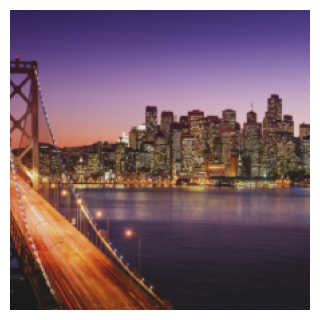

In [26]:
# show the images in the batch
offset = (large_resolution - 224)//2
plt.figure(figsize = (3*start_images_batch.shape[0],3))
for i in range(start_images_batch.shape[0]):
  plt.subplot(1,start_images_batch.shape[0],i+1)
  plt.imshow(
      start_images_batch[i].detach().cpu().numpy().transpose([1,2,0])[
          offset:-offset,offset:-offset
      ]
  )
  plt.xticks([],[])
  plt.yticks([],[])
  plt.gca().set_axis_off()  # Turn off the axis
  plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
  plt.margins(0, 0)  # Remove all margins
  plt.gca().xaxis.set_major_locator(plt.NullLocator())  # Remove x-axis ticks
  plt.gca().yaxis.set_major_locator(plt.NullLocator())  # Remove y-axis ticks
plt.show()

### "Style" guiding image

In [27]:
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/970px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg -O guiding_image1.png

image_paths = [
    "guiding_image1.png"
]

loader = load_images(image_paths)
batch = next(iter(loader))
guiding_images_batch = batch

--2025-02-16 17:01:46--  https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/970px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.153.240, 2620:0:860:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.153.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 356804 (348K) [image/jpeg]
Saving to: ‘guiding_image1.png’

guiding_image1.png  100%[===================>] 348.44K  --.-KB/s    in 0.1s    

2025-02-16 17:01:46 (3.12 MB/s) - ‘guiding_image1.png’ saved [356804/356804]



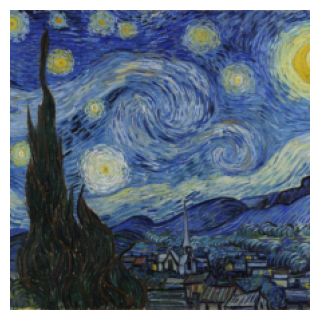

In [28]:
# show the images in the batch
plt.figure(figsize = (3*guiding_images_batch.shape[0],3))
for i in range(guiding_images_batch.shape[0]):
  plt.subplot(1,guiding_images_batch.shape[0],i+1)
  plt.imshow(
      guiding_images_batch[i].detach().cpu().numpy().transpose([1,2,0])
  )
  plt.xticks([],[])
  plt.yticks([],[])
  plt.gca().set_axis_off()  # Turn off the axis
  plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
  plt.margins(0, 0)  # Remove all margins
  plt.gca().xaxis.set_major_locator(plt.NullLocator())  # Remove x-axis ticks
  plt.gca().yaxis.set_major_locator(plt.NullLocator())  # Remove y-axis ticks
plt.show()

### Combining the two

resolutions=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [-0.4025365710258484, -0.3625645041465759, -0.5902557373046875] ell_infty=0.0/255


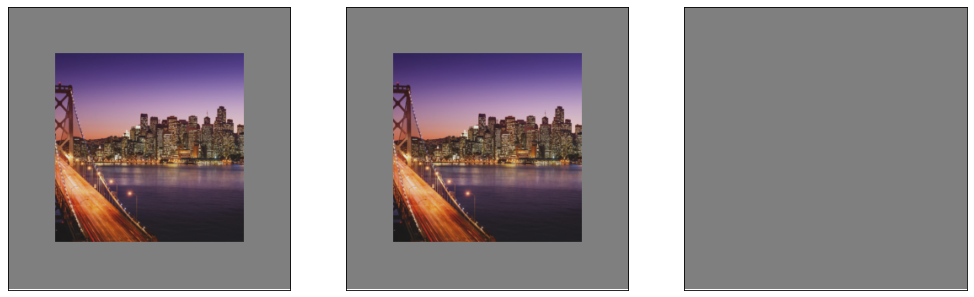

 10%|█         | 10/100 [00:04<00:42,  2.11it/s]

step=10 [-0.877316951751709, -0.8672468066215515, -0.89593505859375] ell_infty=148.4/255


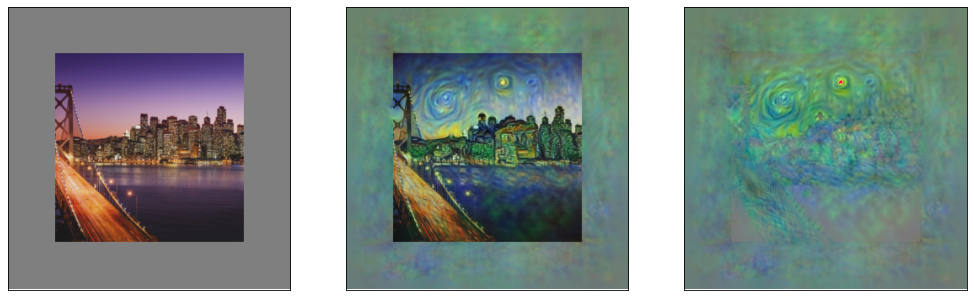

 20%|██        | 20/100 [00:09<00:38,  2.10it/s]

step=20 [-0.9313379526138306, -0.926281213760376, -0.9387054443359375] ell_infty=147.6/255


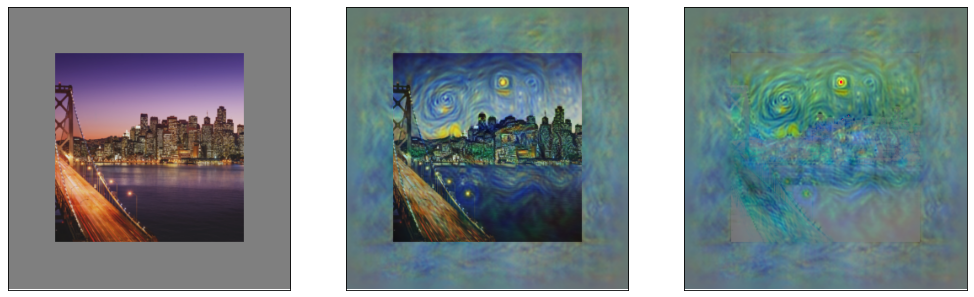

 30%|███       | 30/100 [00:14<00:33,  2.10it/s]

step=30 [-0.9477707743644714, -0.9405252933502197, -0.956298828125] ell_infty=149.1/255


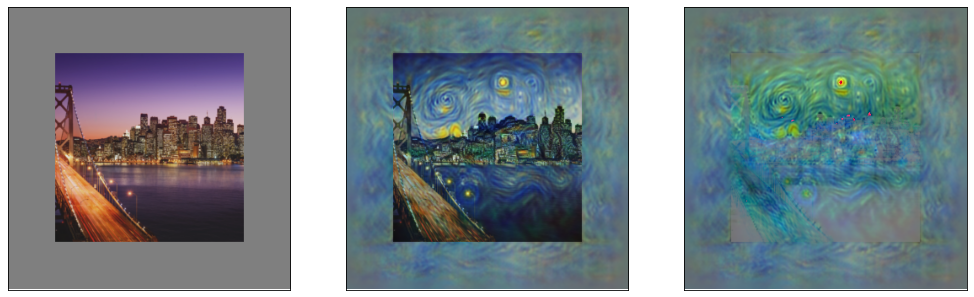

 40%|████      | 40/100 [00:19<00:28,  2.10it/s]

step=40 [-0.9559736847877502, -0.9505527019500732, -0.958831787109375] ell_infty=154.2/255


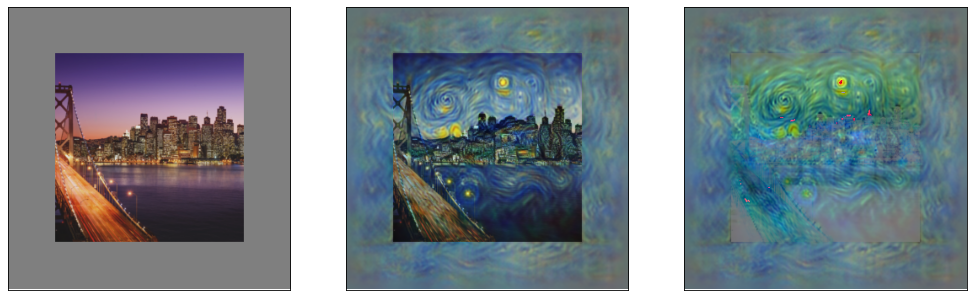

 50%|█████     | 50/100 [00:24<00:23,  2.10it/s]

step=50 [-0.9590692520141602, -0.9541745185852051, -0.9635162353515625] ell_infty=154.5/255


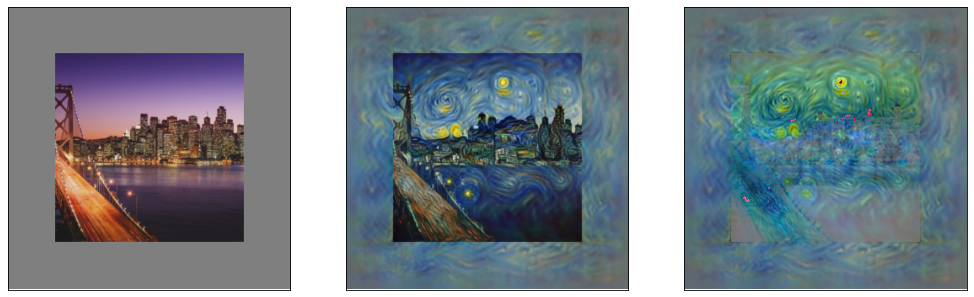

 60%|██████    | 60/100 [00:29<00:19,  2.10it/s]

step=60 [-0.9615774750709534, -0.9609918594360352, -0.9654388427734375] ell_infty=155.4/255


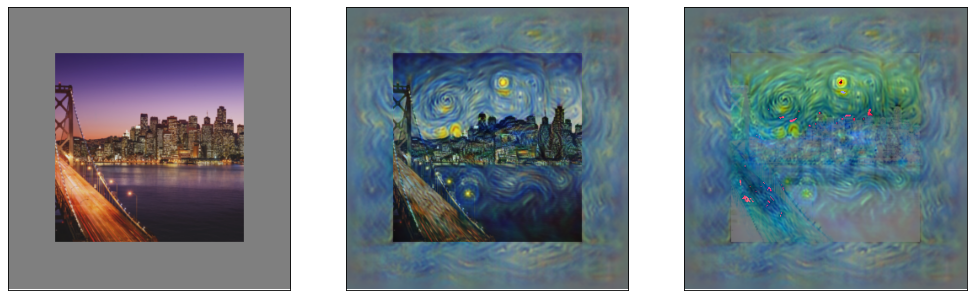

 70%|███████   | 70/100 [00:33<00:14,  2.10it/s]

step=70 [-0.9644178152084351, -0.9648393392562866, -0.96875] ell_infty=155.4/255


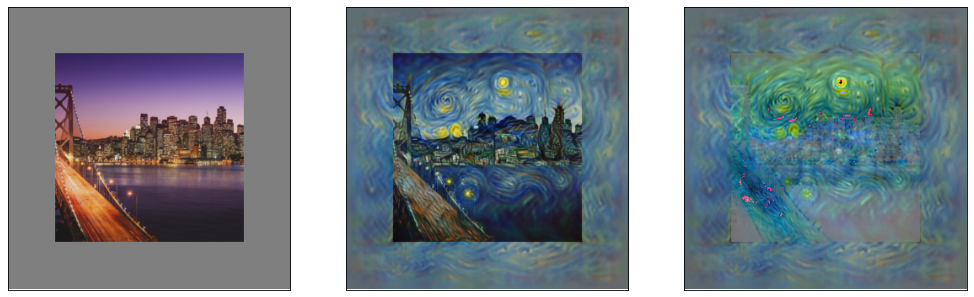

 80%|████████  | 80/100 [00:38<00:09,  2.10it/s]

step=80 [-0.9674394130706787, -0.9656273126602173, -0.96649169921875] ell_infty=156.3/255


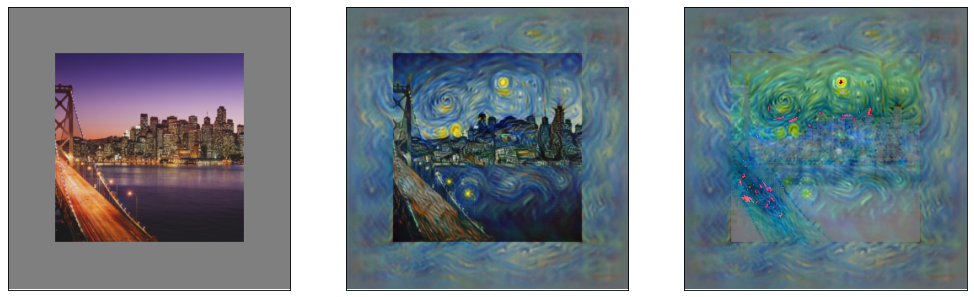

 90%|█████████ | 90/100 [00:43<00:04,  2.10it/s]

step=90 [-0.9674026370048523, -0.9673494100570679, -0.9698028564453125] ell_infty=156.5/255


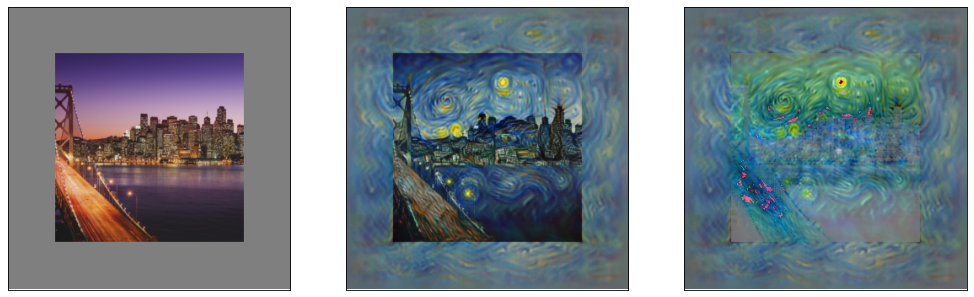

100%|██████████| 100/100 [00:48<00:00,  2.06it/s]


In [29]:
collected_images = generate_image(
  models_and_tokenizers_to_use,
  target_texts_and_values = [],
  guiding_images_tensor = guiding_images_batch,
  starting_image = start_images_batch.detach().cpu().numpy(),
)

## Resulting image

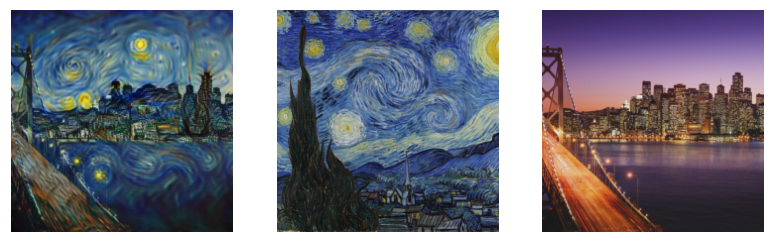

In [30]:
display_images(
    collected_images,
    guiding_images_batch = guiding_images_batch,
    start_images_batch = start_images_batch,
    show_guiding_image = True,
    show_starting_image = True,
)

# Task 4 = Reconstructing an image from its embedding

## Getting the image to reconstruct

In [31]:
!wget https://www.rmg.co.uk/sites/default/files/styles/full_width_1440/public/Henry%20VIII.jpg -O guiding_image1.png

image_paths = [
    "guiding_image1.png"
]

loader = load_images(image_paths)
batch = next(iter(loader))
guiding_images_batch = batch

--2025-02-16 17:02:36--  https://www.rmg.co.uk/sites/default/files/styles/full_width_1440/public/Henry%20VIII.jpg
Resolving www.rmg.co.uk (www.rmg.co.uk)... 23.185.0.2, 2620:12a:8001::2, 2620:12a:8000::2
Connecting to www.rmg.co.uk (www.rmg.co.uk)|23.185.0.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 147318 (144K) [image/jpeg]
Saving to: ‘guiding_image1.png’

guiding_image1.png  100%[===================>] 143.87K  --.-KB/s    in 0.03s   

2025-02-16 17:02:36 (4.46 MB/s) - ‘guiding_image1.png’ saved [147318/147318]



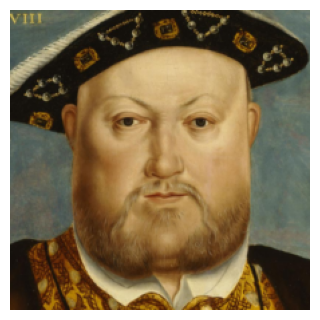

In [32]:
# show the images in the batch
plt.figure(figsize = (3*guiding_images_batch.shape[0],3))
for i in range(guiding_images_batch.shape[0]):
  plt.subplot(1,guiding_images_batch.shape[0],i+1)
  plt.imshow(
      guiding_images_batch[i].detach().cpu().numpy().transpose([1,2,0])
  )
  plt.xticks([],[])
  plt.yticks([],[])
  plt.gca().set_axis_off()  # Turn off the axis
  plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
  plt.margins(0, 0)  # Remove all margins
  plt.gca().xaxis.set_major_locator(plt.NullLocator())  # Remove x-axis ticks
  plt.gca().yaxis.set_major_locator(plt.NullLocator())  # Remove y-axis ticks
plt.show()

## Reconstruction the image

resolutions=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [-0.09335462749004364, -0.078021340072155, -0.1321866512298584] ell_infty=0.0/255


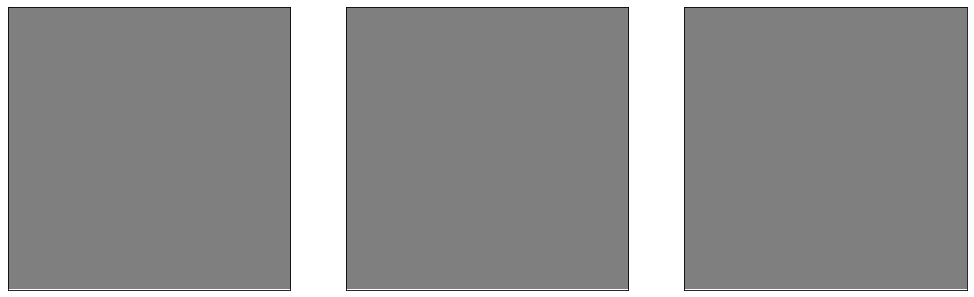

 10%|█         | 10/100 [00:04<00:42,  2.11it/s]

step=10 [-0.13763907551765442, -0.11123492568731308, -0.1457267701625824] ell_infty=68.2/255


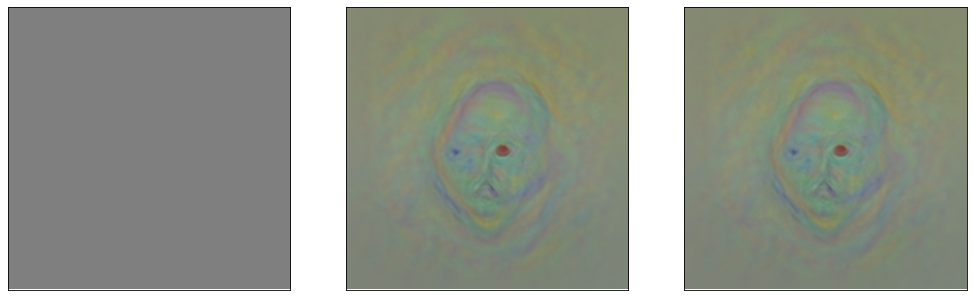

 20%|██        | 20/100 [00:09<00:38,  2.10it/s]

step=20 [-0.28080278635025024, -0.2775934040546417, -0.3051096796989441] ell_infty=88.2/255


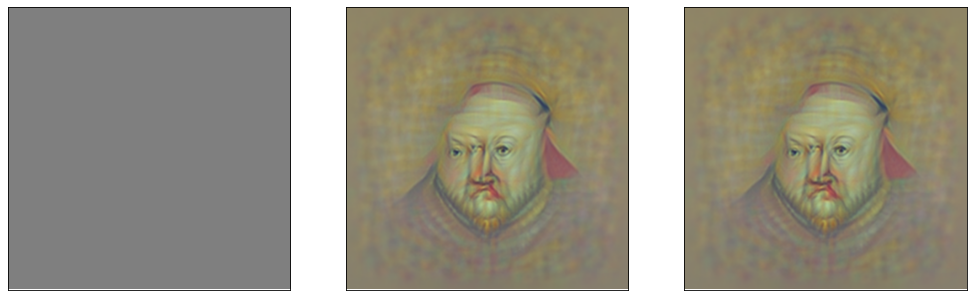

 30%|███       | 30/100 [00:14<00:33,  2.11it/s]

step=30 [-0.30072396993637085, -0.2984245717525482, -0.31675392389297485] ell_infty=89.4/255


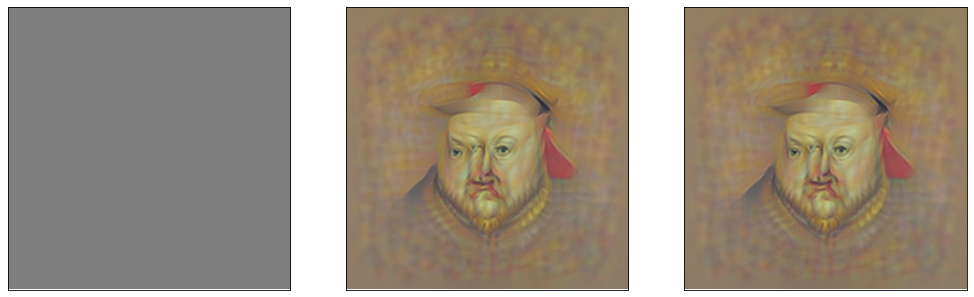

 40%|████      | 40/100 [00:19<00:28,  2.11it/s]

step=40 [-0.3090893626213074, -0.3026358485221863, -0.3186849057674408] ell_infty=94.2/255


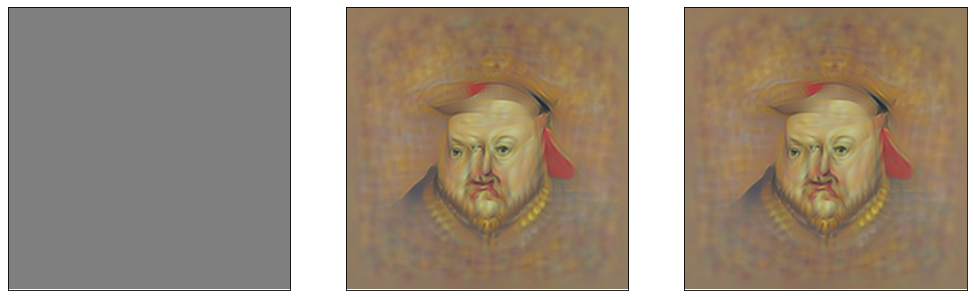

 50%|█████     | 50/100 [00:23<00:23,  2.10it/s]

step=50 [-0.30977898836135864, -0.3056091070175171, -0.3200225830078125] ell_infty=98.1/255


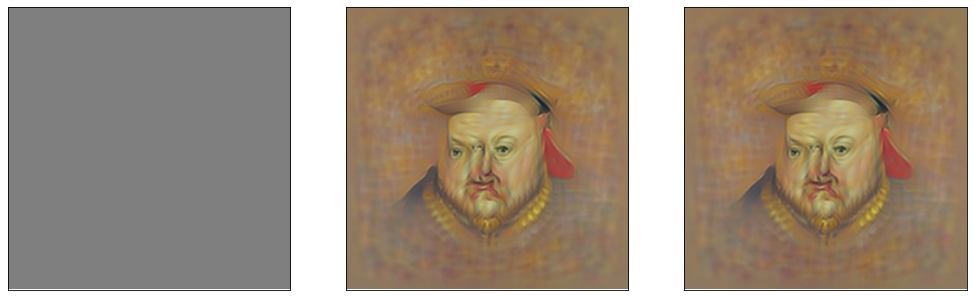

 60%|██████    | 60/100 [00:28<00:19,  2.10it/s]

step=60 [-0.31431716680526733, -0.3091493844985962, -0.3232055902481079] ell_infty=102.4/255


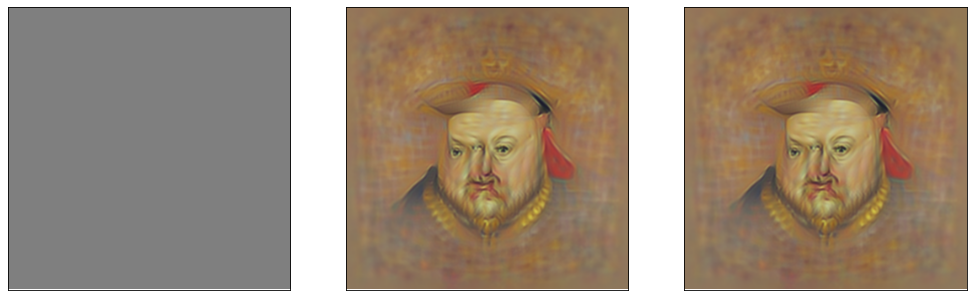

 70%|███████   | 70/100 [00:33<00:14,  2.11it/s]

step=70 [-0.3144318461418152, -0.30919796228408813, -0.3234820067882538] ell_infty=105.1/255


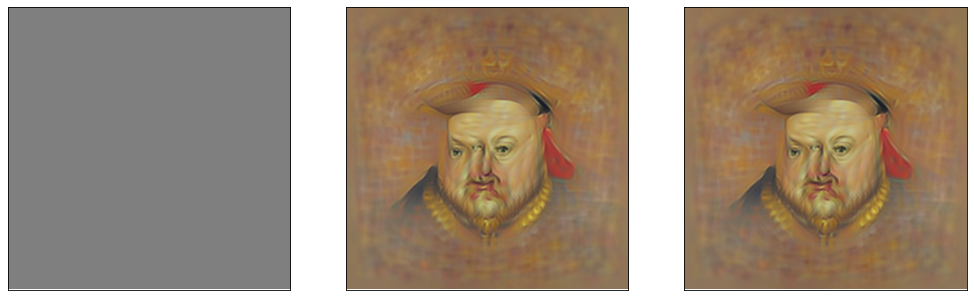

 80%|████████  | 80/100 [00:38<00:09,  2.10it/s]

step=80 [-0.31718289852142334, -0.3108716607093811, -0.3245943784713745] ell_infty=107.7/255


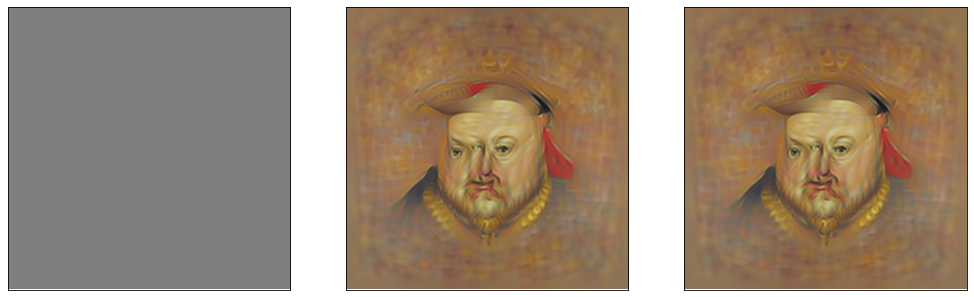

 90%|█████████ | 90/100 [00:43<00:04,  2.11it/s]

step=90 [-0.31669411063194275, -0.31166115403175354, -0.3246750235557556] ell_infty=109.2/255


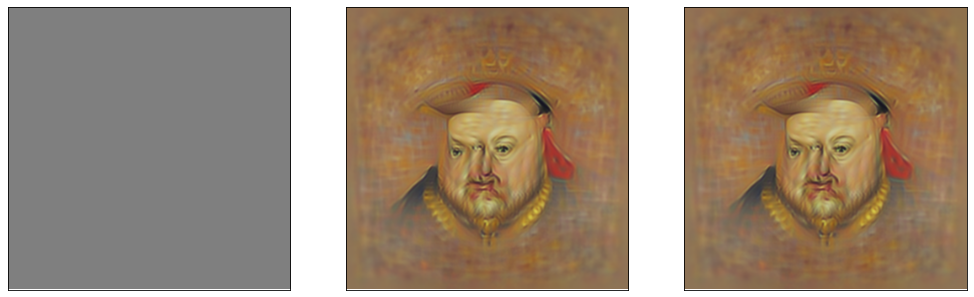

100%|██████████| 100/100 [00:48<00:00,  2.08it/s]


In [33]:
# helping the reconstruction with a content agnostic set of prompts
target_texts_and_values = [
  (0.6,"cohesive single subject"),
  (-0.6, "multiple exposure"),
]

collected_images = generate_image(
  models_and_tokenizers_to_use,
  target_texts_and_values = target_texts_and_values,
  guiding_images_tensor = guiding_images_batch,
)

## Resulting image

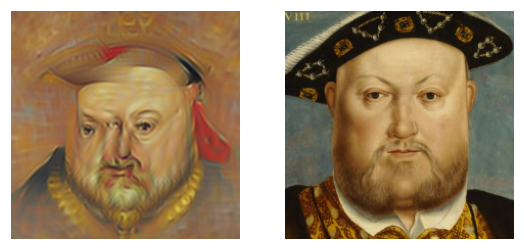

In [34]:
display_images(
    collected_images,
    guiding_images_batch = guiding_images_batch,
    show_guiding_image = True,
)